In [1]:
import os
import joblib
import pickle

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec

import pandas as pd
from pingouin import mixed_anova, anova, pairwise_tukey, pairwise_ttests
import pingouin as pg
from statsmodels.regression.mixed_linear_model import MixedLM

import TwoPUtils as tpu
import STX3KO_analyses as stx
from STX3KO_analyses import utilities as u



plt.rcParams['pdf.fonttype']=42
ko_mice = stx.ymaze_sess_deets.ko_mice

ctrl_mice = stx.ymaze_sess_deets.ctrl_mice
# ctrl_mice = [m for m in ctrl_mice if m not in ('mCherry6')]

%matplotlib inline

%load_ext autoreload
%autoreload 2

/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
#  write HSE to be any stopping period > 1 sec

#  Plot some examples
#  sort by whether cell participates or not
#  sort within participants and non-participants by location of place field


#  Plot size of events and proportion greater than chance

#  Frequency & duration of events

# % of population in HSEs

# % of HSEs that each cell participates in 

# activity rate of participants vs non-participants

# trial x trial correlation of participants vs non-participants
    # get some examples
    

# predicting stability across days from HSE participation

In [2]:
class HSE:
    
    def __init__(self, sess):
        
        if isinstance(sess.scan_info,list):
            self.frame_rate = sess.scan_info[0]['frame_rate']
        else:
            self.frame_rate = sess.scan_info['frame_rate']
        
        
        
        
        self.spks = sess.timeseries['spks']
        self.trial_mat = sess.trial_matrices['spks_nostop']
        self.speed = sess.timeseries['speed']
        self.lr = sess.timeseries['LR'].ravel()
        self.t = sess.timeseries['t'].ravel()
        self.reward = sess.timeseries['reward'].ravel()
        self.block_number = sess.timeseries['block_number'].ravel()
        
        self.novel_arm = sess.novel_arm
        self.trial_info = sess.trial_info
        self.trial_start_inds = sess.trial_start_inds
        self.teleport_inds = sess.teleport_inds
        
        
        # mask for post reward epochs
        self.post_reward_bool = None
        self.post_reward_epochs = None
        self._post_reward_mask(sess)
        
        
        # threshold spks timeseries to get "significant" transients
        self.thresh_spks = .2*np.nanmax(sess.timeseries['spks'], axis=-1, keepdims=True)
        self.spks_th = 1.*np.copy(self.spks)
        self.spks_th[self.spks<self.thresh_spks]=0
        
        
        
        # all activations during stopping, including periods when not near reward zone
        self.activation_mask = None
        # activations during reward consumption
        self.post_reward_activation_mask = None
        # all activations during running
        self.trial_activation_mask = None
        self.get_activations()
        
        boxcar = np.ones([1,4]) # 500 ms window
        self.post_reward_activation_boxcar = sp.signal.convolve(self.post_reward_activation_mask,boxcar,mode='same')
        self.pop_coactivity_boxcar = self.post_reward_activation_boxcar.sum(axis=0)
        
        self._rng = np.random.default_rng()
        
        self.coactivity_thresh = None
        self.shuff_results = None
        self.post_reward_coactivity_mask = None
        self.pop_coactivity_th = None
        if self.post_reward_epochs.shape[0]>0:
            self.get_popact_thresh()
        
            self.post_reward_coactive_mask = np.copy(self.post_reward_activation_boxcar)
            self.post_reward_coactive_mask[:,self.pop_coactivity_boxcar<self.coactivity_thresh]=0

            self.pop_coactivity_th = np.zeros(self.pop_coactivity_boxcar.shape)
            self.pop_coactivity_th[self.pop_coactivity_boxcar>=self.coactivity_thresh]=1
        
        
        
        # active during trial and during reward consumption
#         self.post_reward_reactivation_mask = None
#         # active during trial but not during reward consumption
#         self.non_reactivation_mask = None
#         self.get_post_reward_reactivations()
        
        
    def _post_reward_mask(self, sess, max_post_reward_time = 10, max_post_reward_dist = 3):
        post_reward_bool = 0.*self.t.ravel()
        for start,stop in zip(self.trial_start_inds, self.teleport_inds):

            cum_reward = np.cumsum(self.reward.ravel()[start:stop])>0
            post_reward_inds = np.argwhere(cum_reward).ravel()
            if post_reward_inds.shape[0]>0:
                post_reward_bool[post_reward_inds[0]+start:start+np.minimum(post_reward_inds[0]+int(max_post_reward_time*self.frame_rate),stop-start)] = 1


        nov_post_rzone_mask = (sess.timeseries['LR']==sess.novel_arm)*(sess.timeseries['t']>sess.rzone_nov['tfront']+max_post_reward_dist)
        fam_post_rzone_mask = (sess.timeseries['LR']==-1*sess.novel_arm)*(sess.timeseries['t']>sess.rzone_fam['tfront']+max_post_reward_dist)
        speed_mask = self.speed.ravel()>=2
        
        post_reward_bool[nov_post_rzone_mask.ravel()]=0
        post_reward_bool[fam_post_rzone_mask.ravel()]=0
        post_reward_bool[speed_mask] = 0
        
        # self.post_reward_bool = post_reward_bool
        
        _post_reward_bool = np.zeros([post_reward_bool.shape[0]+1,])
        _post_reward_bool[1:] = post_reward_bool
        post_reward_starts = np.argwhere(_post_reward_bool[1:]>_post_reward_bool[:-1]).ravel()
        _post_reward_bool = np.zeros([post_reward_bool.shape[0]+1,])
        _post_reward_bool[:-1] = post_reward_bool
        post_reward_ends = np.argwhere(_post_reward_bool[:-1]>_post_reward_bool[1:]).ravel()
        assert post_reward_starts.shape[0]==post_reward_ends.shape[0], "post reward starts and ends screwed up"
        
        
        
        # filter for post reward periods greater than 1 sec
        epoch_mask = (post_reward_ends-post_reward_starts)/self.frame_rate>1
        post_reward_starts, post_reward_ends = post_reward_starts[epoch_mask], post_reward_ends[epoch_mask]
        
        post_reward_epochs = np.zeros([post_reward_starts.shape[0],2])
        post_reward_epochs[:, 0] = post_reward_starts
        post_reward_epochs[:, 1] = post_reward_ends
        self.post_reward_epochs = post_reward_epochs
        # print(self.post_reward_epochs.shape)
        
        
        
        self.post_reward_bool = np.zeros(post_reward_bool.shape)
        for start, stop in zip(post_reward_starts, post_reward_ends):
            self.post_reward_bool[start:stop] = 1
            
        self.post_reward_starts = [int(ind) for ind in post_reward_starts]
        self.post_reward_ends = [int(ind) for ind in post_reward_ends]
        
        
    def get_activations(self):
    
        spks_ledge = 1*(np.diff(1.*(self.spks_th>0),prepend=0,axis=-1)>0)

        self.activation_mask = 1*(spks_ledge>0)*(self.speed<2)
        self.post_reward_activation_mask = 1*(spks_ledge>0)*(self.speed<2)*(self.post_reward_bool[np.newaxis,:])
        self.trial_activation_mask = 1*(spks_ledge>0)*(1-self.post_reward_bool[np.newaxis,:])
        
    @staticmethod
    def shuff_act(post_reward_activation_mask, post_reward_epochs, rng, post_reward_bool, bin_edges=np.arange(51)):
        
        act = 1*np.copy(post_reward_activation_mask)
        for ep_ind in range(post_reward_epochs.shape[0]):
            start, stop = [int(s) for s in post_reward_epochs[ep_ind,:]]

            _act = act[:,start:stop]
            shifts = rng.integers(0,stop-start, (_act.shape[0],))

            for cell in range(_act.shape[0]):
                _act[cell,:] = np.roll(_act[cell,:], shifts[cell])
            act[:,start:stop]=_act

        boxcar = np.ones([4,]) # 250 ms window - results in 500 ms coincidence
        pop_act_boxcar = sp.signal.convolve(act.sum(axis=0), boxcar, mode='same')
        return np.histogram(pop_act_boxcar[post_reward_bool>0], bin_edges)[0]

    def get_popact_thresh(self, nperms = 100, p_thresh=.95):
        self.bin_edges = np.arange(100)
        
        
        results = np.array(joblib.Parallel(n_jobs=-1)(joblib.delayed(self.shuff_act)(self.post_reward_activation_mask, 
                                                                                     self.post_reward_epochs, 
                                                                                     self._rng,
                                                                                     self.post_reward_bool,
                                                                                     bin_edges=self.bin_edges) for i in range(nperms)))
        # with Pool() as p
        #     results = np.array(p.starmap(self.shuff_act, range(nperms), ))
            
        shuff_hist = results.sum(axis=0)
        shuff_hist = shuff_hist/shuff_hist.sum()
        self.coactivity_thresh = self.bin_edges[:-1][np.argwhere(np.cumsum(shuff_hist)>p_thresh).ravel()[0]]
        self.shuff_results = results
        
        
        
    

        

In [4]:
hse_dict = {}
basedir = '/home/mplitt/YMazeReplayPkls/'
os.makedirs(basedir, exist_ok=True)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    hse_dict[cond_key] = {}
    for day in range(6):
        hse_dict[cond_key][day] = {}
        for mouse in mice:
            print(mouse,day)
            filename = basedir + f'{mouse}_day{day}.pkl'
            if True: #not os.path.exists(filename):
                hse = HSE(u.load_single_day(mouse,day,verbose=False))

                with open(filename, 'wb') as file:
                    pickle.dump(hse,file)
                
            hse_dict[cond_key][day][mouse]=filename
                                                               

4467331.1 0
4467331.2 0
4467332.1 0
4467332.2 0
4467333.1 0
mCherry6 0
mCherry7 0
mCherry8 0
mCherry9 0
4467331.1 1
4467331.2 1
4467332.1 1
4467332.2 1
30_11_2020 YMaze_LNovel
30_11_2020 YMaze_LNovel
4467333.1 1
mCherry6 1
mCherry7 1
mCherry8 1
mCherry9 1
4467331.1 2
4467331.2 2
4467332.1 2
4467332.2 2
4467333.1 2
mCherry6 2
mCherry7 2
mCherry8 2
mCherry9 2
4467331.1 3
4467331.2 3
02_12_2020 YMaze_LNovel
02_12_2020 YMaze_LNovel
4467332.1 3
4467332.2 3
4467333.1 3
mCherry6 3
mCherry7 3
mCherry8 3
mCherry9 3
4467331.1 4
4467331.2 4
4467332.1 4
4467332.2 4
4467333.1 4
mCherry6 4
mCherry7 4
mCherry8 4
mCherry9 4
4467331.1 5
4467331.2 5
4467332.1 5
4467332.2 5
4467333.1 5


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:97: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus3/2P_Data/4467333.1/05_12_2020/YMaze_LNovel/YMaze_LNovel_001_002.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


mCherry6 5
mCherry7 5
mCherry8 5
mCherry9 5
4467975.1 0
4467975.2 0
4467975.3 0
4467975.4 0
4467975.5 0
Cre7 0
Cre9 0
4467975.1 1


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.2 1


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 1


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/29_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.4 1
4467975.5 1
Cre7 1
Cre9 1
4467975.1 2


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.1/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.2 2


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/30_09_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 2


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.3/30_09_2020/YMaze_LNovel/YMaze_LNovel_002_007.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.4 2
4467975.5 2
Cre7 2
Cre9 2
4467975.1 3
4467975.2 3


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/01_10_2020/YMaze_LNovel/YMaze_LNovel_001_004.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 3
4467975.4 3
4467975.5 3
Cre7 3
Cre9 3
4467975.1 4
4467975.2 4


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/02_10_2020/YMaze_LNovel/YMaze_LNovel_001_009.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 4
4467975.4 4
4467975.5 4
Cre7 4
Cre9 4
4467975.1 5
4467975.2 5


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:229: UserWarning: Could not find sbxmat file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:238: UserWarning: Could not find sbx file at /mnt/BigDisk/2P_scratch/4467975.2/03_10_2020/YMaze_LNovel/YMaze_LNovel_001_008.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


4467975.3 5
4467975.4 5
4467975.5 5
Cre7 5
Cre9 5


In [3]:
hse_dict = {}
basedir = '/home/mplitt/YMazeReplayPkls/'
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    hse_dict[cond_key] = {}
    for day in range(6):
        hse_dict[cond_key][day] = {}
        for mouse in mice:
            filename = basedir + f'{mouse}_day{day}.pkl'
            hse_dict[cond_key][day][mouse]=filename

# Proportion of eligible stopping periods with a highly synchronous event

In [19]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 'nov_prop_sig_events':[], 'fam_prop_sig_events': [], 'tot_prop_sig_events':[]}
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
            nov_N, nov_sig_counter = 0, 0
            fam_N, fam_sig_counter = 0, 0
            for start, stop in zip(hse.post_reward_starts, hse.post_reward_ends):
                nov_bool = hse.lr[start]==hse.novel_arm
                if nov_bool:
                    nov_N += 1
                    nov_sig_counter += 1*(hse.pop_coactivity_th[start:stop].sum()>0)
                else:
                    fam_N += 1
                    fam_sig_counter += 1*(hse.pop_coactivity_th[start:stop].sum()>0)
                    
            nov_N, fam_N = np.maximum(nov_N, 1E-5), np.maximum(fam_N, 1E-5)
                    
            df['ctrl/cre'].append(cond_key)
            df['day'].append(day)
            df['mouse'].append(mouse)
            df['m'].append(m)
            df['nov_prop_sig_events'].append(float(nov_sig_counter)/nov_N)
            df['fam_prop_sig_events'].append(float(fam_sig_counter)/fam_N)
            df['tot_prop_sig_events'].append(float(nov_sig_counter+fam_sig_counter)/(nov_N + fam_N))
df = pd.DataFrame(df)
                    

                    
                
                

In [24]:
df.to_pickle(f'{basedir}/prop_active_df.pkl')

In [11]:
df = pd.read_pickle(f'{basedir}/prop_active_df.pkl')

In [12]:
mask = (df['ctrl/cre']=='ctrl')*(df['day']==0)
df[mask]

,ctrl/cre,day,mouse,m,nov_prop_sig_events,fam_prop_sig_events,tot_prop_sig_events
0,ctrl,0,4467331.1,0,0.900000,0.818182,0.826531
1,ctrl,0,4467331.2,1,0.833333,0.845361,0.844037
2,ctrl,0,4467332.1,2,0.928571,0.855263,0.866667
3,ctrl,0,4467332.2,3,0.777778,0.509091,0.546875
4,ctrl,0,4467333.1,4,0.846154,0.618421,0.651685
5,ctrl,0,mCherry6,5,0.000000,0.285714,0.266667
6,ctrl,0,mCherry7,6,0.000000,0.181818,0.181818
7,ctrl,0,mCherry8,7,0.000000,0.307692,0.307692
8,ctrl,0,mCherry9,8,0.000000,0.300000,0.300000


Text(0.5, 0, 'Days')

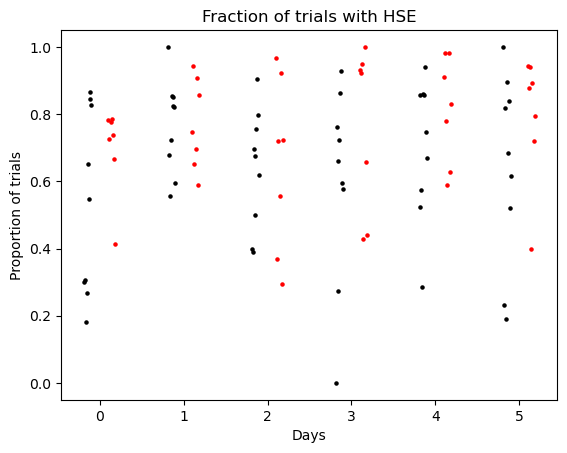

In [18]:
fig, ax = plt.subplots()

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax.scatter(x, _df['tot_prop_sig_events'], color='black', s=5)

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax.scatter(x, _df['tot_prop_sig_events'], color='red', s=5)

ax.set_ylabel('Proportion of trials')
ax.set_title('Fraction of trials with HSE')
ax.set_xlabel('Days')




In [31]:
aov = mixed_anova(data=df, dv='nov_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.491452    1   14  0.491452  1.692021  0.214339  0.107827   
1          day  0.578464    5   70  0.115693  1.532905  0.190806  0.098688   
2  Interaction  0.303747    5   70  0.060749  0.804916  0.550004  0.054368   

      eps  
0     NaN  
1  0.7004  
2     NaN  


In [32]:
aov = mixed_anova(data=df, dv='fam_prop_sig_events', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc  p-GG-corr  \
0     ctrl/cre  0.258416    1   14  0.258416  1.761422  0.205686        NaN   
1          day  0.330237    5   70  0.066047  1.936249  0.099192   0.120294   
2  Interaction  0.112941    5   70  0.022588  0.662196  0.653298        NaN   

        np2       eps sphericity   W-spher   p-spher  
0  0.111755       NaN        NaN       NaN       NaN  
1  0.121500  0.689343      False  0.157985  0.046688  
2  0.045164       NaN        NaN       NaN       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/parametric.py:1568: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)


# Example Events

In [44]:
cond_key = 'ctrl'
mouse = ctrl_mice[2]
day = 5

# cond_key = 'cre'
# mouse = ko_mice[6]
# day = 1
# hse = HSE(u.load_single_day(mouse,day))
with open(hse_dict[cond_key][day][mouse], 'rb') as file:
    hse = pickle.load(file)

0.14013975155279504


Text(0.5, 0.98, '4467332.1, 5')

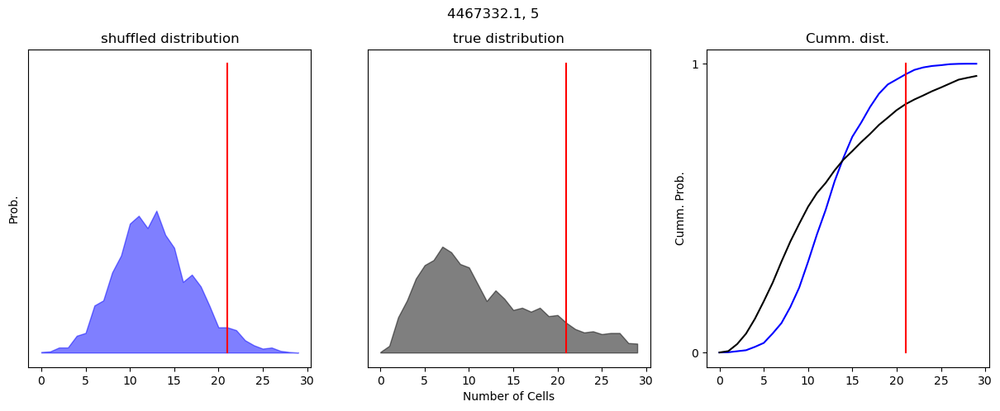

In [45]:
fig, ax = plt.subplots(1,3, figsize=[15,5])

shuff_res = hse.shuff_results.sum(axis=0)
shuff_res = shuff_res/shuff_res.sum()
ax[0].fill_between(hse.bin_edges[:30], shuff_res[:30], color='blue', alpha=.5)
ax[0].plot(hse.coactivity_thresh*np.array([1,1]), [0,.2], color='red')

pop_counts,_ = np.histogram(hse.pop_coactivity_boxcar[hse.post_reward_bool>0],hse.bin_edges)
pop_counts = pop_counts/pop_counts.sum()

c = {'ctrl':'black', 'cre':'red'}[cond_key]
ax[1].fill_between(hse.bin_edges[:30], pop_counts[:30], color=c, alpha=.5)
ax[1].plot(hse.coactivity_thresh*np.array([1,1]), [0,.2], color='red')

x = np.arange(30)
ax[2].plot(x, np.cumsum(shuff_res[:30]), color='blue')
ax[2].plot(x, np.cumsum(pop_counts[:30]), color=c)
ax[2].plot(hse.coactivity_thresh*np.array([1,1]), [0,1], color='red')
thresh_bin = np.argwhere(hse.bin_edges>hse.coactivity_thresh).ravel()[0]
print(pop_counts[thresh_bin:].sum())
# ax[2].plot(x,)



ax[0].set_yticks([])
ax[1].set_yticks([])
ax[2].set_yticks([0,1])

ax[0].set_title('shuffled distribution')
ax[1].set_title('true distribution')
ax[2].set_title('Cumm. dist.')
ax[0].set_ylabel('Prob.')
ax[2].set_ylabel('Cumm. Prob.')

ax[1].set_xlabel('Number of Cells')
fig.suptitle(f'{mouse}, {day}')

/tmp/ipykernel_2321524/3556298612.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax = plt.subplots(3,1, sharex=True)


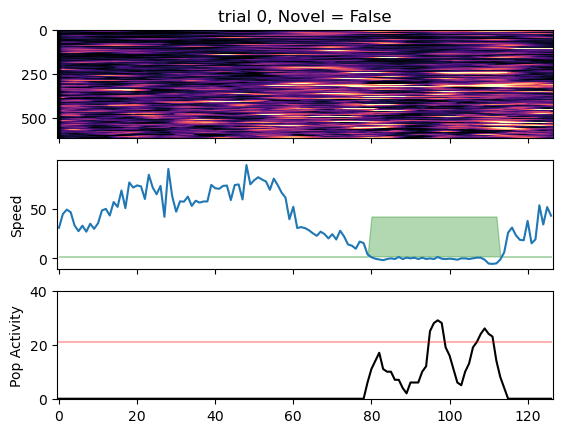

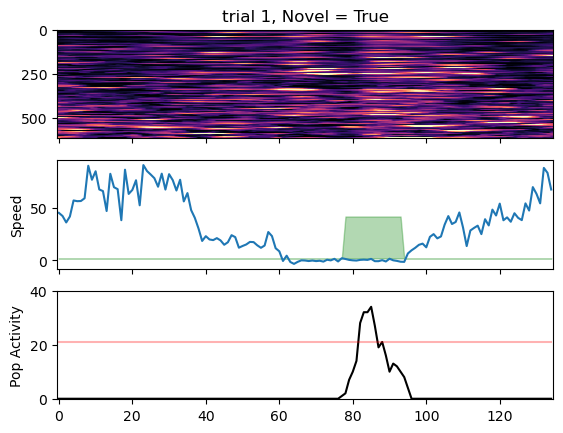

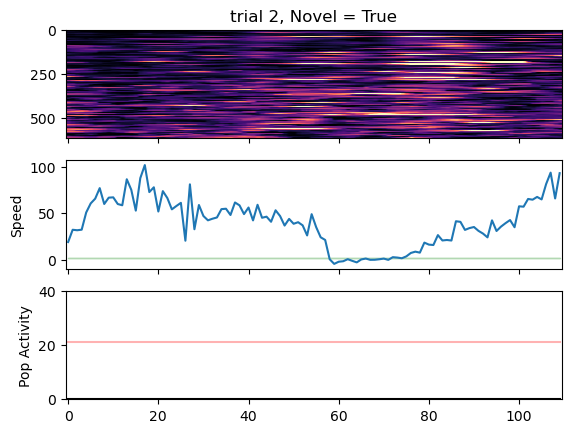

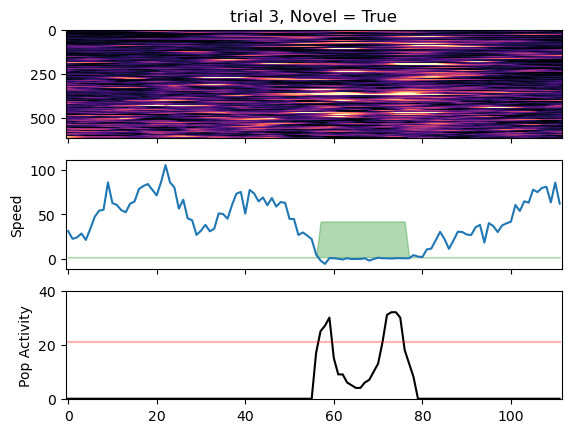

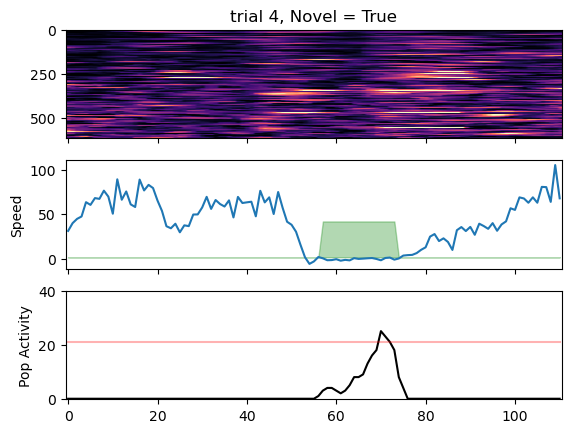

...

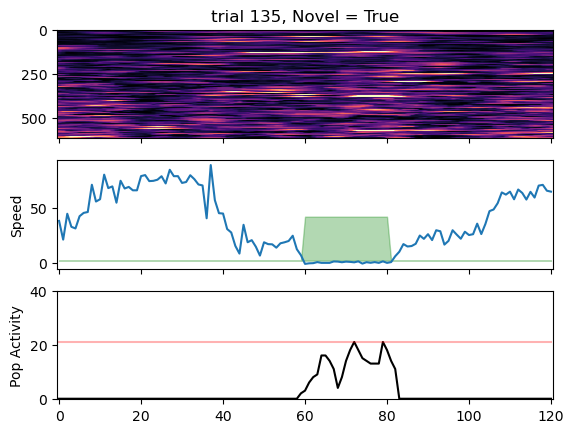

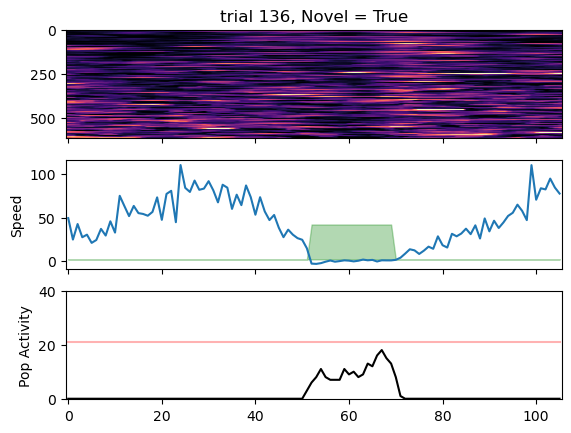

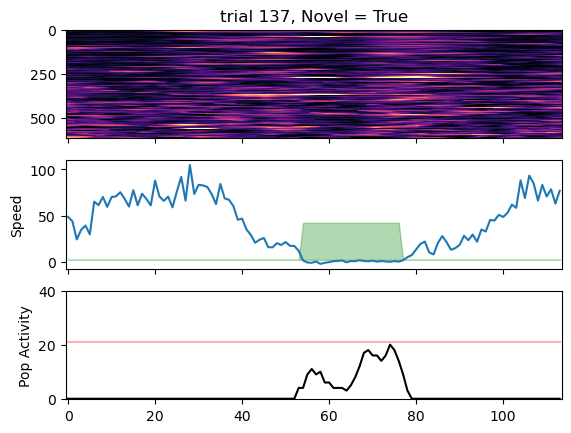

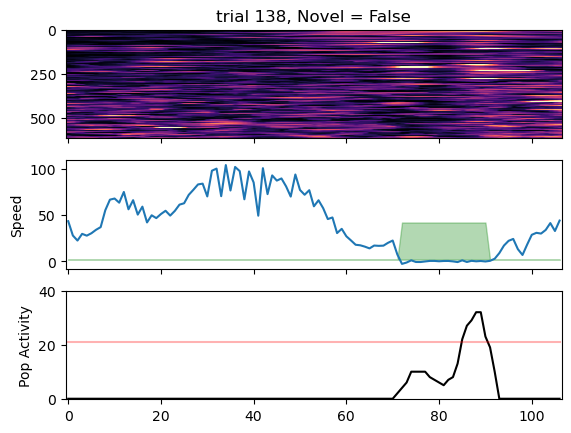

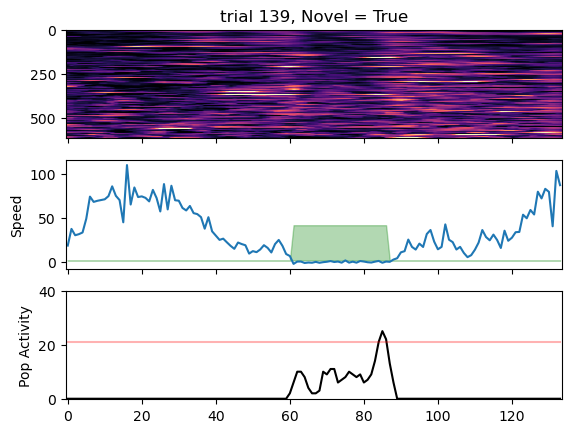

In [47]:

# ax.plot(hse.pop_coactivity_boxcar)
cell_mask = hse.post_reward_coactive_mask.sum(axis=-1)>0
for i, (start, stop) in enumerate(zip(hse.trial_start_inds[:], hse.teleport_inds[:])):
    fig,ax = plt.subplots(3,1, sharex=True)
    nov = hse.trial_info['LR'][i] == hse.novel_arm
    ax[0].set_title(f'trial {i}, Novel = {nov}')
    x = np.arange(stop-start)
    ax[0].imshow(hse.spks[cell_mask, :][:,start:stop]/np.nanpercentile(hse.spks[cell_mask,:],99, axis=-1, keepdims=True), aspect = 'auto', cmap='magma', vmin=.0, vmax=.5)
    ax[1].set_ylabel('Speed')
    # ax[0].imshow(hse.post_reward_activation_boxcar[cell_mask, :][:,start:stop], aspect = 'auto', cmap='magma', vmin=0, vmax=1)
    ax[1].plot(hse.speed.ravel()[start:stop])
    ax[1].fill_between(x,2, 2+40*hse.post_reward_bool[start:stop], color='green', alpha=.3)
    ax[2].plot(hse.pop_coactivity_boxcar[start:stop], color='black')
    ax[2].set_ylim([-.2,40])
    ax[2].plot(np.arange(stop-start),hse.coactivity_thresh*np.ones([stop-start,]), color='red', alpha=.3)
    ax[2].set_ylabel('Pop Activity')

In [18]:
hse.post_reward_coactive_mask.shape

(1381, 34310)

# Proportion of distribution greater than chance

In [4]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'tail_weight':[]}


for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                if hse.post_reward_epochs.shape[0]>0:
                    thresh_bin = np.argwhere(hse.bin_edges>hse.coactivity_thresh).ravel()[0]
                    pop_counts,_ = np.histogram(hse.pop_coactivity_boxcar[hse.post_reward_bool>0],hse.bin_edges)
                    pop_counts = pop_counts/pop_counts.sum()
                    tail_weight = pop_counts[thresh_bin:].sum()
                    
                    df['ctrl/cre'].append(cond_key)
                    df['day'].append(day)
                    df['mouse'].append(mouse)
                    df['m'].append(m)
                    df['tail_weight'].append(tail_weight)
                    
df = pd.DataFrame(df)

                    


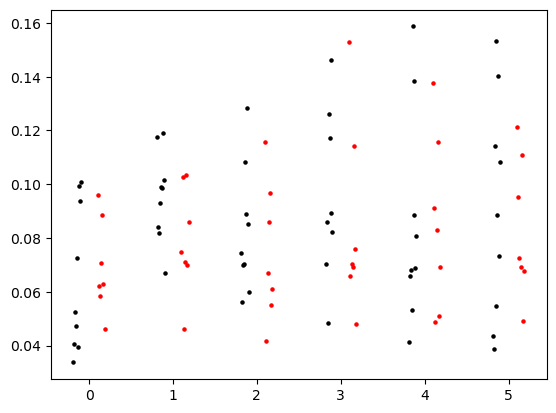

In [5]:
fig, ax = plt.subplots()

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax.scatter(x, _df['tail_weight'], color='black', s=5)

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax.scatter(x, _df['tail_weight'], color='red', s=5)

# Frequency and duration of events
## fam v novel

# Proportion of population that participates in HSE
## fam v novel

# Proportion of events that each cell participates in
## fam v novel

# Activity rate of reactivated cells vs not 

In [12]:

df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'nov_activated':[], 'nov_activated_histcounts': [],
      'nov_nonactivated':[], 'nov_nonactivated_histcounts': [],
      'fam_activated':[], 'fam_activated_histcounts': [],
      'fam_nonactivated':[], 'fam_nonactivated_histcounts': [],
      'nov_diff':[], 'fam_diff':[]}

edges = np.linspace(0,1,num=50)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
                
                if hse.post_reward_epochs.shape[0]>0:
                
                    nov_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==hse.novel_arm].sum(axis=-1)>0
                    nov_trial_mask = hse.trial_info['LR']==hse.novel_arm
                    nov_spks = hse.trial_mat[nov_trial_mask, :, :]
                    nov_activated = np.nanmean(np.nanmean(nov_spks[:, :, nov_cell_mask], axis=0), axis=0)
                    nov_nonactivated = np.nanmean(np.nanmean(nov_spks[:, :, ~nov_cell_mask], axis=0), axis=0)

                    fam_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==-1*hse.novel_arm].sum(axis=-1)>0
                    fam_trial_mask = hse.trial_info['LR']==-1*hse.novel_arm
                    fam_spks = hse.trial_mat[fam_trial_mask, :, :]
                    fam_activated = np.nanmean(np.nanmean(fam_spks[:, :, fam_cell_mask], axis=0), axis=0)
                    fam_nonactivated = np.nanmean(np.nanmean(fam_spks[:, :, ~fam_cell_mask], axis=0), axis=0)

                    df['ctrl/cre'].append(cond_key)
                    df['day'].append(day)
                    df['mouse'].append(mouse)
                    df['m'].append(m)

                    df['nov_activated'].append(nov_activated.mean())
                    df['nov_activated_histcounts'].append(np.histogram(nov_activated,edges)[0])

                    df['nov_nonactivated'].append(nov_nonactivated.mean())
                    df['nov_nonactivated_histcounts'].append(np.histogram(nov_nonactivated,edges)[0])

                    df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

                    df['fam_activated'].append(fam_activated.mean())
                    df['fam_activated_histcounts'].append(np.histogram(fam_activated,edges)[0])

                    df['fam_nonactivated'].append(fam_nonactivated.mean())
                    df['fam_nonactivated_histcounts'].append(np.histogram(fam_nonactivated,edges)[0])

                    df['fam_diff'].append(fam_activated.mean() - fam_nonactivated.mean())

df = pd.DataFrame(df)


/tmp/ipykernel_2320480/2323905279.py:34: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_2320480/2323905279.py:40: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


In [18]:
df.to_pickle(f'{basedir}/activity_rate_df.pkl')

In [19]:
df = pd.read_pickle(f'{basedir}/activity_rate_df.pkl')

controls
Day 0
familiar t=0.22133110632525496 p=0.8356742997796821
novel t=5.024851239496226 p=0.00736013937612048
Day 1
familiar t=-0.47803907862755474 p=0.6495409658338642
novel t=3.627751046265889 p=0.01099469605657936
Day 2
familiar t=-2.211801625050469 p=0.06897197925146206
novel t=4.087592085970374 p=0.006446720194938364
Day 3
familiar t=-2.1872633320058985 p=0.07134338883346163
novel t=3.53944142979414 p=0.012227161062527936
Day 4
familiar t=-2.4857806873453487 p=0.04185431692314701
novel t=2.68627217139777 p=0.031254005719515275
Day 5
familiar t=-1.7523776517370229 p=0.12316499315994373
novel t=-0.5369813282283206 p=0.6079176355120175
cre
Day 0
familiar t=-0.798374804859495 p=0.46087435178882274
novel t=2.1747675196834506 p=0.08165023898552888
Day 1
familiar t=-0.7302400580764646 p=0.4980067372072775
novel t=1.2321293568614022 p=0.27267852223569194
Day 2
familiar t=-3.0135929984561147 p=0.023591014018038287
novel t=1.0725198320047993 p=0.3247177181436835
Day 3
familiar t=-0.891

Text(0, 0.5, 'Firing Rate (replayed - non-replayed)')

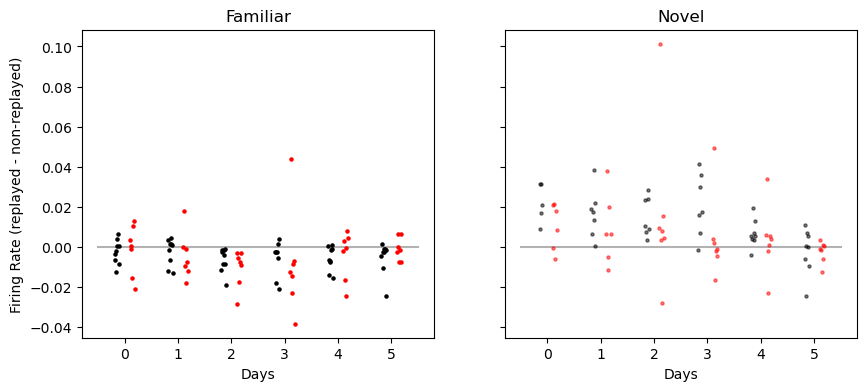

In [26]:
fig, ax = plt.subplots(1,2, figsize=[10,4], sharey=True)

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
ax[0].scatter(x, 15.46*_df['fam_diff'], color='black', s=5)
ax[1].scatter(x, 15.46*_df['nov_diff'], color='black', s=5, alpha=.5)

print("controls")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
ax[0].scatter(x, 15.46*_df['fam_diff'], color='red', s=5)
ax[1].scatter(x, 15.46*_df['nov_diff'], color='red', s=5, alpha=.5)

print("cre")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

ax[0].plot([-.5,5.5], [0,0], color='black', alpha=.3, zorder=-1)
ax[1].plot([-.5,5.5], [0,0], color='black', alpha=.3, zorder=-1)

ax[0].set_title('Familiar')
ax[1].set_title('Novel')

ax[0].set_xlabel('Days')
ax[1].set_xlabel('Days')

ax[0].set_ylabel('Firing Rate (replayed - non-replayed)')

# mask = df['ctrl/cre']=='cre'
# _df = df[mask]
# x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
# ax.scatter(x, _df['tot_prop_sig_events'], color='red', s=5)

In [23]:
aov = mixed_anova(data=df, dv='nov_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2            MS         F     p-unc  \
0     ctrl/cre  0.000003    1    8  3.084413e-06  0.514250  0.493707   
1          day  0.000009    5   40  1.780831e-06  2.386355  0.055076   
2  Interaction  0.000003    5   40  5.641403e-07  0.755961  0.586794   

        np2       eps  
0  0.060399       NaN  
1  0.229759  0.356355  
2  0.086337       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d


In [24]:
aov = mixed_anova(data=df, dv='fam_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source            SS  DF1  DF2            MS         F     p-unc  \
0     ctrl/cre  2.795719e-08    1   13  2.795719e-08  0.020765  0.887630   
1          day  2.020275e-06    5   65  4.040550e-07  1.215797  0.311783   
2  Interaction  9.854461e-07    5   65  1.970892e-07  0.593039  0.705285   

        np2       eps  
0  0.001595       NaN  
1  0.085524  0.409146  
2  0.043628       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d


3.1492861250576882 0.0016718242303727078
-8.163819782884065 7.250593439853479e-16


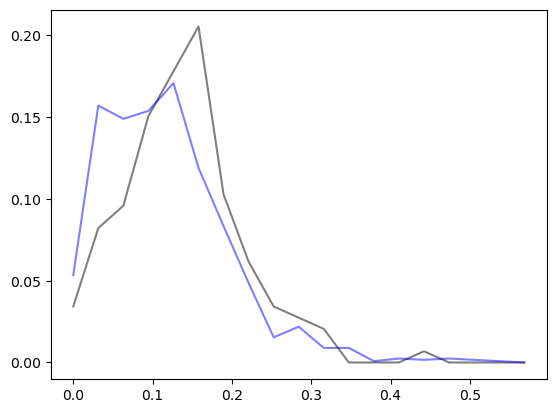

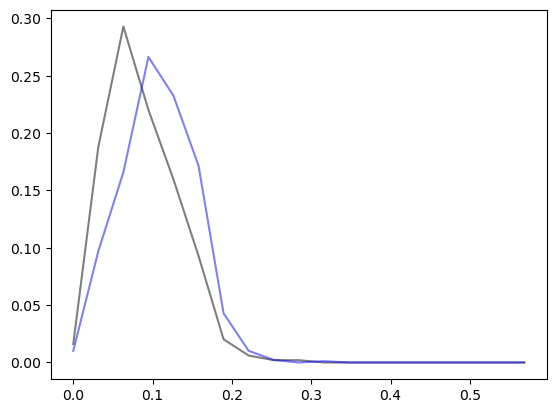

In [51]:
fig, ax = plt.subplots()
edges = np.linspace(0,.6, num=20)
count, _ = np.histogram(nov_activated, edges)
ax.plot(edges[:-1], count/count.sum(), color='black', alpha=.5)
count, _ = np.histogram(nov_nonactivated, edges)
ax.plot(edges[:-1], count/count.sum(), color='blue', alpha=.5)

t,p = sp.stats.ttest_ind(nov_activated, nov_nonactivated)
print(t,p)

fig, ax = plt.subplots()
edges = np.linspace(0,.6, num=20)
count, _ = np.histogram(fam_activated, edges)
ax.plot(edges[:-1], count/count.sum(), color='black', alpha=.5)
count, _ = np.histogram(fam_nonactivated, edges)
ax.plot(edges[:-1], count/count.sum(), color='blue', alpha=.5)

t,p = sp.stats.ttest_ind(fam_activated, fam_nonactivated)
print(t,p)
# ax.hist(nov_nonactivated, color='blue', alpha = .5)

# Trial x trial correlation of reactivated vs not

In [5]:
df = {'ctrl/cre':[], 'day':[], 'mouse': [], 'm': [], 
      'nov_activated':[], 'nov_activated_histcounts': [],
      'nov_nonactivated':[], 'nov_nonactivated_histcounts': [],
      'fam_activated':[], 'fam_activated_histcounts': [],
      'fam_nonactivated':[], 'fam_nonactivated_histcounts': [],
      'nov_diff':[], 'fam_diff':[]}

edges = np.linspace(0,1,num=50)
for cond_key, mice in zip(('ctrl', 'cre'),(ctrl_mice, ko_mice)):
    for day in range(6):
        for m, mouse in enumerate(mice):
            print(mouse,day)
            with open(hse_dict[cond_key][day][mouse], 'rb') as file:
                hse = pickle.load(file)
            
            if hse.post_reward_epochs.shape[0]>0:
                tt_corr_mat = sp.stats.zscore(hse.trial_mat, axis=1, nan_policy='omit')
                tt_corr_mat[np.isnan(tt_corr_mat)]=0
                tt_corr_mat = 1/(hse.trial_mat.shape[1]-1)*np.matmul(np.transpose(tt_corr_mat, axes=(2, 0, 1)), np.transpose(tt_corr_mat, axes=(2, 1, 0)))

                for cell in range(tt_corr_mat.shape[0]):
                    _mat = tt_corr_mat[cell,:, :]
                    _mat[np.diag_indices_from(_mat)]=np.nan
                    tt_corr_mat[cell, :, :] = _mat
                # tt_corr_mat[:,np.diag_indices(tt_corr_mat.shape[1])]=np.nan

                print(tt_corr_mat.shape)

                nov_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==hse.novel_arm].sum(axis=-1)>0
                nov_trial_mask = hse.trial_info['LR']==hse.novel_arm
                nov_activated = np.nanmean(np.nanmean(tt_corr_mat[nov_cell_mask, :, :][:, nov_trial_mask, :][:, :, nov_trial_mask], axis=-1), axis=-1)
                nov_nonactivated = np.nanmean(np.nanmean(tt_corr_mat[~nov_cell_mask, :, :][:, nov_trial_mask, :][:, :, nov_trial_mask], axis=-1), axis=-1)

                fam_cell_mask = hse.post_reward_coactive_mask[:,hse.lr==-1*hse.novel_arm].sum(axis=-1)>0
                fam_trial_mask = hse.trial_info['LR']==-1*hse.novel_arm
                fam_activated = np.nanmean(np.nanmean(tt_corr_mat[fam_cell_mask, :, :][:, fam_trial_mask, :][:, :, fam_trial_mask], axis=-1), axis=-1)
                fam_nonactivated = np.nanmean(np.nanmean(tt_corr_mat[~fam_cell_mask, :, :][:, fam_trial_mask, :][:, :, fam_trial_mask], axis=-1), axis=-1)

                df['ctrl/cre'].append(cond_key)
                df['day'].append(day)
                df['mouse'].append(mouse)
                df['m'].append(m)

                df['nov_activated'].append(nov_activated.mean())
                df['nov_activated_histcounts'].append(np.histogram(nov_activated,edges)[0])

                df['nov_nonactivated'].append(nov_nonactivated.mean())
                df['nov_nonactivated_histcounts'].append(np.histogram(nov_nonactivated,edges)[0])

                df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())

                df['fam_activated'].append(fam_activated.mean())
                df['fam_activated_histcounts'].append(np.histogram(fam_activated,edges)[0])

                df['fam_nonactivated'].append(fam_nonactivated.mean())
                df['fam_nonactivated_histcounts'].append(np.histogram(fam_nonactivated,edges)[0])

                df['fam_diff'].append(fam_activated.mean() - fam_nonactivated.mean())

df = pd.DataFrame(df)

4467331.1 0
(1381, 139, 139)
4467331.2 0
(1283, 140, 140)
4467332.1 0
(1568, 138, 138)
4467332.2 0
(1694, 100, 100)
4467333.1 0
(1554, 140, 140)
mCherry6 0
(1030, 140, 140)


/tmp/ipykernel_2320480/3828484620.py:44: RuntimeWarning: Mean of empty slice.
  df['nov_activated'].append(nov_activated.mean())
/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_2320480/3828484620.py:50: RuntimeWarning: Mean of empty slice.
  df['nov_diff'].append(nov_activated.mean()-nov_nonactivated.mean())


mCherry7 0
(909, 140, 140)
mCherry8 0
(639, 140, 140)
mCherry9 0
(977, 140, 140)
4467331.1 1
(1093, 140, 140)
4467331.2 1
(1170, 140, 140)
4467332.1 1
(1422, 128, 128)
4467332.2 1
(1036, 136, 136)
4467333.1 1
(1450, 140, 140)
mCherry6 1
(799, 140, 140)
mCherry7 1
(873, 140, 140)
mCherry8 1
(740, 140, 140)
mCherry9 1
(1038, 140, 140)
4467331.1 2
(972, 140, 140)
4467331.2 2
(1093, 140, 140)
4467332.1 2
(1155, 139, 139)
4467332.2 2
(1537, 140, 140)
4467333.1 2
(1447, 140, 140)
mCherry6 2
(961, 140, 140)
mCherry7 2
(781, 140, 140)
mCherry8 2
(1030, 140, 140)
mCherry9 2
(996, 140, 140)
4467331.1 3
(1068, 140, 140)
4467331.2 3
(1048, 140, 140)
4467332.1 3
(1046, 140, 140)
4467332.2 3
(1684, 140, 140)
4467333.1 3
(1467, 140, 140)
mCherry6 3
(985, 140, 140)
mCherry7 3
(858, 140, 140)
mCherry8 3
(736, 138, 138)
mCherry9 3
4467331.1 4
(962, 139, 139)
4467331.2 4
(1033, 140, 140)
4467332.1 4
(1208, 140, 140)
4467332.2 4
(1509, 139, 139)
4467333.1 4
(1354, 140, 140)
mCherry6 4
(965, 140, 140)
mChe

In [7]:
df.to_pickle(f'{basedir}/trial_trial_corr_df.pkl')

In [38]:
edges = np.linspace(0,1,num=50)
df = pd.read_pickle(f'{basedir}/trial_trial_corr_df.pkl')

controls
Day 0
familiar t=5.606316275310952 p=0.004971805268222349
novel t=3.4521764820190732 p=0.026002728932581123
Day 1
familiar t=5.489141592205508 p=0.0015302904845161322
novel t=6.087337543397998 p=0.0008939813868151868
Day 2
familiar t=3.2290452961494207 p=0.017931997946733565
novel t=6.660469318831462 p=0.0005538938258281885
Day 3
familiar t=2.3438694397370345 p=0.05753866586430483
novel t=5.873280339591199 p=0.0010785279991630645
Day 4
familiar t=2.187972018402906 p=0.06487269987731492
novel t=9.161154041367354 p=3.800109664645103e-05
Day 5
familiar t=4.636267088638228 p=0.002380041056616305
novel t=3.0470869999578722 p=0.018659625778088405
cre
Day 0
familiar t=0.3666324774788725 p=0.7288969842898737
novel t=1.6459099877245278 p=0.1607007773088762
Day 1
familiar t=-0.40140961010152804 p=0.7046997374596786
novel t=2.2646177987573255 p=0.07292862611096429
Day 2
familiar t=-1.4311303054057456 p=0.20234947908675463
novel t=2.182582757503276 p=0.07180518599276225
Day 3
familiar t=-

Text(0, 0.5, '$\\Delta$ Trial x Trial Corr (replayed - non-replayed)')

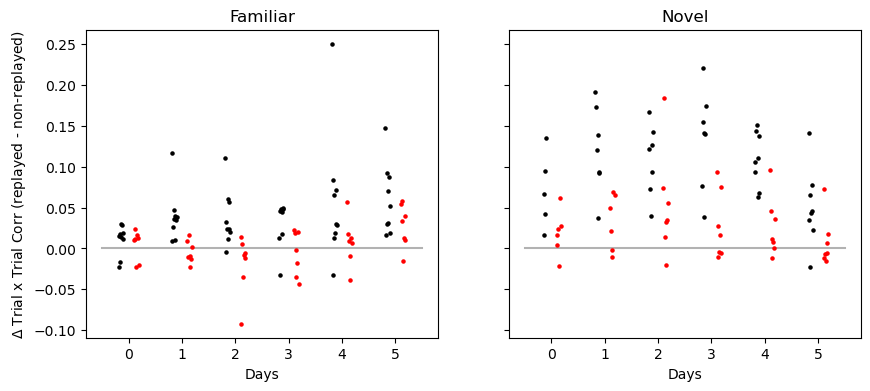

In [39]:
fig, ax = plt.subplots(1,2, figsize=[10,4], sharey=True)

mask = df['ctrl/cre']=='ctrl'
_df = df[mask]
x = _df['day'] - _df['m']/len(ctrl_mice)*.1 - .1
# ax[0].scatter(x, _df['fam_activated'], color='black', s=5)
# ax[1].scatter(x, _df['nov_activated'], color='black', s=5)
ax[0].scatter(x, _df['fam_diff'], color='black', s=5)
ax[1].scatter(x, _df['nov_diff'], color='black', s=5)

print("controls")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')

mask = df['ctrl/cre']=='cre'
_df = df[mask]
x = _df['day'] + _df['m']/len(ko_mice)*.1 + .1
# ax[0].scatter(x, _df['fam_activated'], color='red', s=5)
# ax[1].scatter(x, _df['nov_activated'], color='red', s=5)
ax[0].scatter(x, _df['fam_diff'], color='red', s=5)
ax[1].scatter(x, _df['nov_diff'], color='red', s=5)

print("cre")
for day in range(6):
    _df = df[mask*(df['day']==day)*(~np.isnan(df['nov_diff'].to_numpy()))]
    # print(_df)
    
    t,p = sp.stats.ttest_1samp(_df['fam_diff'],0)
    print(f'Day {day}')
    print(f'familiar t={t} p={p}')
    t,p = sp.stats.ttest_1samp(_df['nov_diff'],0)
    print(f'novel t={t} p={p}')
    
ax[0].plot([-.5,5.5], [0, 0], color='black', alpha=.3, zorder=-1)
ax[1].plot([-.5,5.5], [0, 0], color='black', alpha=.3, zorder=-1)


ax[0].set_title('Familiar')
ax[1].set_title('Novel')

ax[0].set_xlabel('Days')
ax[1].set_xlabel('Days')

ax[0].set_ylabel(r'$\Delta$ Trial x Trial Corr (replayed - non-replayed)')


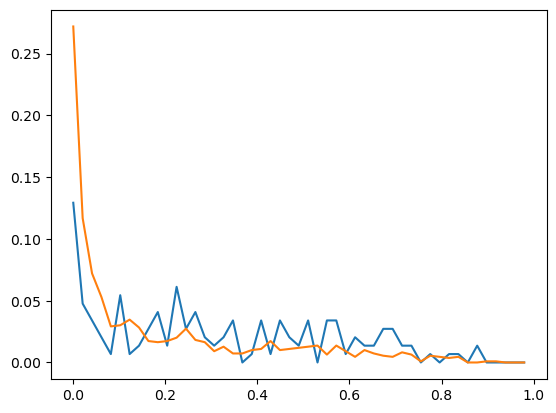

In [52]:
mask = (df['mouse']==ctrl_mice[0])*(df['day']==0)
_df = df[mask]
# _df['nov_activated_histcounts']
fig, ax= plt.subplots()
na = _df['nov_activated_histcounts'].iloc[0]
na = na/na.sum()
ax.plot(edges[:-1], na)
nna = _df['nov_nonactivated_histcounts'].iloc[0]
nna = nna/nna.sum()
ax.plot(edges[:-1], nna)


In [30]:
aov = mixed_anova(data=df[df['day']<5], dv='nov_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.052629    1    8  0.052629  8.942362  0.017324  0.527811   
1          day  0.004963    4   32  0.001241  1.056182  0.394090  0.116626   
2  Interaction  0.005400    4   32  0.001350  1.149208  0.351422  0.125607   

        eps  
0       NaN  
1  0.552794  
2       NaN  


In [31]:
aov = mixed_anova(data=df[df['day']<5], dv='fam_diff', between='ctrl/cre', within='day', subject='mouse')
print(aov)

        Source        SS  DF1  DF2        MS         F     p-unc       np2  \
0     ctrl/cre  0.016626    1   13  0.016626  9.352196  0.009156  0.418402   
1          day  0.002512    4   52  0.000628  1.609916  0.185712  0.110193   
2  Interaction  0.003481    4   52  0.000870  2.230667  0.078306  0.146459   

        eps  
0       NaN  
1  0.717656  
2       NaN  


/home/mplitt/mambaforge/envs/STX3/lib/python3.8/site-packages/pingouin/distribution.py:1006: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d


7.0544500980336355 2.7340907551618806e-12
-0.7243156372702826 0.4689948431211236


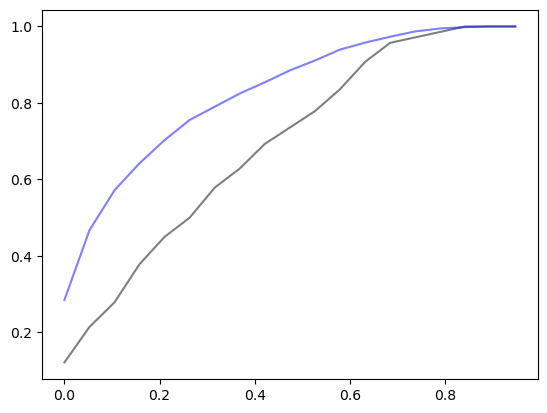

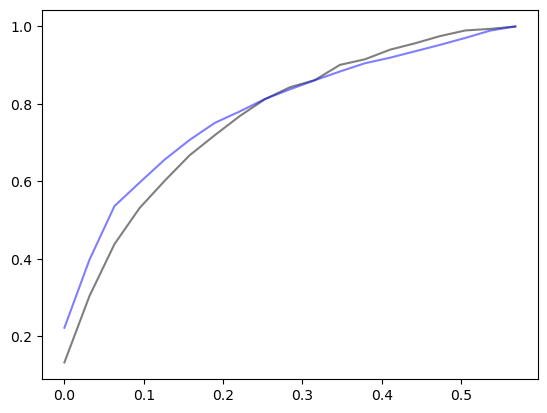

In [54]:
fig, ax = plt.subplots()
edges = np.linspace(0,1, num=20)
count, _ = np.histogram(nov_activated_corr, edges)
ax.plot(edges[:-1], np.cumsum(count/count.sum()), color='black', alpha=.5)
count, _ = np.histogram(nov_nonactivated_corr, edges)
ax.plot(edges[:-1], np.cumsum(count/count.sum()), color='blue', alpha=.5)

t,p = sp.stats.ttest_ind(nov_activated_corr, nov_nonactivated_corr)
print(t,p)

fig, ax = plt.subplots()
edges = np.linspace(0,.6, num=20)
count, _ = np.histogram(fam_activated_corr, edges)
ax.plot(edges[:-1], np.cumsum(count/count.sum()), color='black', alpha=.5)
count, _ = np.histogram(fam_nonactivated_corr, edges)
ax.plot(edges[:-1], np.cumsum(count/count.sum()), color='blue', alpha=.5)

t,p = sp.stats.ttest_ind(fam_activated_corr, fam_nonactivated_corr)
print(t,p)

# correlation across days

In [ ]:
# load common roi mapping 

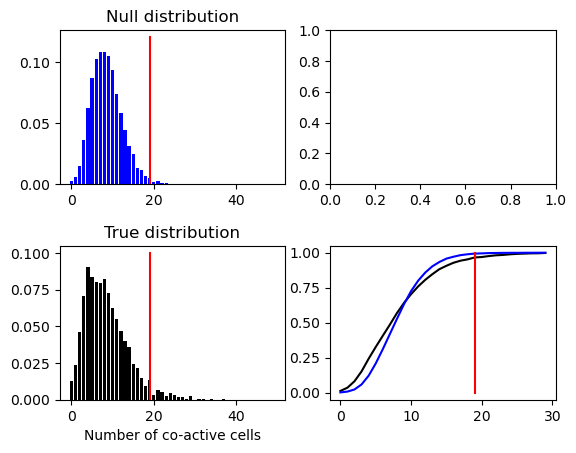

In [22]:
fig, ax = plt.subplots(2,2)

fig.subplots_adjust(hspace=.4)
shuff_hist = results.sum(axis=0)
shuff_hist = shuff_hist/shuff_hist.sum()
ax[0,0].bar(np.arange(50), shuff_hist, color='blue')
thresh = np.arange(50)[np.argwhere(np.cumsum(shuff_hist)>.99).ravel()[0]]
ax[0,0].plot([thresh,thresh], [0,.12], color='red')
ax[0,0].set_title('Null distribution')

hist = np.histogram(rr.pop_coactivity_boxcar[rr.post_reward_bool>0],np.arange(51))[0]
hist = hist/hist.sum()

ax[1,0].bar(np.arange(50), hist, color='black')
ax[1,0].plot([thresh,thresh], [0,.1], color='red')
ax[1,0].set_title('True distribution')
ax[1,0].set_xlabel('Number of co-active cells')

ax[1,1].plot(np.arange(30), np.cumsum(hist[:30]), color='black')
ax[1,1].plot(np.arange(30), np.cumsum(shuff_hist[:30]), color='blue')
ax[1,1].plot([thresh,thresh], [0,1], color='red')
